# Introduction

The objective of this project is to perform sentiment analysis (only positive and negative) on an imbalanced hotel review dataset.

This project covers:
- TF-IDF
- count features
- logistic regression
- naive bayes
- svm
- xgboost
- grid search
- word vectors (Universal Sentence Encoder model from Tensorflow HUB)
    -  
- NN Model Serve

Although this project covers classical ml methods and feature engineering techniques, it will mainly focus on using Tf-Hub pretrained model in text classification.  

The final LSTM model achieved an accuracy of ~81% in Test Dataset (75:25 split)

# Libraires & Configuration

### Check GPU

## Libraries 

## Install `Tensorflow Text`

We need `tensorflow_text` for **Universal Sentence Encoder (USE)**

---
latest version of `tensorflow_text==2.8.1` may cause crashes with kaggle GPU. I tried with different version of `tensorflow_text` and ended up with **v2.6**

In [2]:
%%capture
!pip install tensorflow_text==2.6.0

In [4]:
from tqdm import tqdm
import numpy as np
import pandas as pd 
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns
import plotly.express as px

from numpy import newaxis
from wordcloud import WordCloud, STOPWORDS

from tqdm import tqdm

from sklearn import preprocessing, decomposition, model_selection, metrics, pipeline
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.decomposition import TruncatedSVD

from sklearn.naive_bayes import MultinomialNB
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression

import nltk
from nltk import word_tokenize
from nltk.corpus import stopwords

import xgboost as xgb
import tensorflow as tf
import tensorflow_hub as hub
import tensorflow_text

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, LSTM, Bidirectional, Activation, GRU, BatchNormalization
from tensorflow.keras.layers import GlobalMaxPooling1D, Conv1D, MaxPooling1D, Flatten, Bidirectional, SpatialDropout1D
from tensorflow.keras.layers import Embedding
from tensorflow.keras.preprocessing import sequence, text
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

from tensorflow.keras.optimizers import Adam

%matplotlib inline
sns.set(style='whitegrid', palette='muted', font_scale=1.2)

plt.rcParams['figure.figsize'] = 12, 8

RANDOM_SEED = 42

nltk.download('stopwords')
stop_words = stopwords.words('english')

[nltk_data] Downloading package stopwords to /usr/share/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


### GPU Test

#### Important Package Version

## Load HUB Model
---
**USE(Universal Sentence Encoder)**

In [8]:
module_url = 'https://tfhub.dev/google/universal-sentence-encoder-multilingual-large/3'
use = hub.load(module_url)

2022-04-25 20:14:43.908713: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-04-25 20:14:43.909700: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-04-25 20:14:43.910347: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-04-25 20:14:43.911507: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-04-25 20:14:43.912187: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from S

### Sample Text Embedding With USE

In [9]:
txt_1 = ["the bedroom is cozy"]
txt_2 = ["comfortable bedroom"]

In [10]:
emb_1 = use(txt_1)
emb_2 = use(txt_2)

#### Embedding Dimension

In [11]:
print(emb_1.shape)

(1, 512)


#### Correlation

The USE is trained on a number of tasks but one of the main tasks is to identify the similarity between pairs of sentences. 
The authors note that the task was to identify **"semantic textual similarity (STS) between sentence pairs scored by Pearson correlation with human judgments"**.

In [12]:
print(np.inner(emb_1, emb_2).flatten()[0])

0.8467271


# EDA

In [13]:
df_hotel_reviews = pd.read_csv("../input/515k-hotel-reviews-data-in-europe/Hotel_Reviews.csv")
df_hotel_reviews.head()

,Hotel_Address,Additional_Number_of_Scoring,Review_Date,Average_Score,Hotel_Name,Reviewer_Nationality,Negative_Review,Review_Total_Negative_Word_Counts,Total_Number_of_Reviews,Positive_Review,Review_Total_Positive_Word_Counts,Total_Number_of_Reviews_Reviewer_Has_Given,Reviewer_Score,Tags,days_since_review,lat,lng
0,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,8/3/2017,7.7,Hotel Arena,Russia,I am so angry that i made this post available...,397,1403,Only the park outside of the hotel was beauti...,11,7,2.9,"[' Leisure trip ', ' Couple ', ' Duplex Double...",0 days,52.360576,4.915968
1,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,8/3/2017,7.7,Hotel Arena,Ireland,No Negative,0,1403,No real complaints the hotel was great great ...,105,7,7.5,"[' Leisure trip ', ' Couple ', ' Duplex Double...",0 days,52.360576,4.915968
2,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,7/31/2017,7.7,Hotel Arena,Australia,Rooms are nice but for elderly a bit difficul...,42,1403,Location was good and staff were ok It is cut...,21,9,7.1,"[' Leisure trip ', ' Family with young childre...",3 days,52.360576,4.915968
3,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,7/31/2017,7.7,Hotel Arena,United Kingdom,My room was dirty and I was afraid to walk ba...,210,1403,Great location in nice surroundings the bar a...,26,1,3.8,"[' Leisure trip ', ' Solo traveler ', ' Duplex...",3 days,52.360576,4.915968
4,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,7/24/2017,7.7,Hotel Arena,New Zealand,You When I booked with your company on line y...,140,1403,Amazing location and building Romantic setting,8,3,6.7,"[' Leisure trip ', ' Couple ', ' Suite ', ' St...",10 days,52.360576,4.915968


In [14]:
print(f"{df_hotel_reviews.shape[0]} rows, {df_hotel_reviews.shape[1]} columns")

515738 rows, 17 columns


#### Columns

In [15]:
df_hotel_reviews.columns.tolist()

['Hotel_Address',
 'Additional_Number_of_Scoring',
 'Review_Date',
 'Average_Score',
 'Hotel_Name',
 'Reviewer_Nationality',
 'Negative_Review',
 'Review_Total_Negative_Word_Counts',
 'Total_Number_of_Reviews',
 'Positive_Review',
 'Review_Total_Positive_Word_Counts',
 'Total_Number_of_Reviews_Reviewer_Has_Given',
 'Reviewer_Score',
 'Tags',
 'days_since_review',
 'lat',
 'lng']

In [16]:
df_hotel_reviews.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 515738 entries, 0 to 515737
Data columns (total 17 columns):
 #   Column                                      Non-Null Count   Dtype  
---  ------                                      --------------   -----  
 0   Hotel_Address                               515738 non-null  object 
 1   Additional_Number_of_Scoring                515738 non-null  int64  
 2   Review_Date                                 515738 non-null  object 
 3   Average_Score                               515738 non-null  float64
 4   Hotel_Name                                  515738 non-null  object 
 5   Reviewer_Nationality                        515738 non-null  object 
 6   Negative_Review                             515738 non-null  object 
 7   Review_Total_Negative_Word_Counts           515738 non-null  int64  
 8   Total_Number_of_Reviews                     515738 non-null  int64  
 9   Positive_Review                             515738 non-null  object 
 

In [17]:
df_hotel_reviews.describe().T

,count,mean,std,min,25%,50%,75%,max
Additional_Number_of_Scoring,515738.0,498.081836,500.538467,1.000000,169.000000,341.000000,660.000000,2682.000000
Average_Score,515738.0,8.397487,0.548048,5.200000,8.100000,8.400000,8.800000,9.800000
Review_Total_Negative_Word_Counts,515738.0,18.539450,29.690831,0.000000,2.000000,9.000000,23.000000,408.000000
Total_Number_of_Reviews,515738.0,2743.743944,2317.464868,43.000000,1161.000000,2134.000000,3613.000000,16670.000000
Review_Total_Positive_Word_Counts,515738.0,17.776458,21.804185,0.000000,5.000000,11.000000,22.000000,395.000000
Total_Number_of_Reviews_Reviewer_Has_Given,515738.0,7.166001,11.040228,1.000000,1.000000,3.000000,8.000000,355.000000
Reviewer_Score,515738.0,8.395077,1.637856,2.500000,7.500000,8.800000,9.600000,10.000000
lat,512470.0,49.442439,3.466325,41.328376,48.214662,51.499981,51.516288,52.400181
lng,512470.0,2.823803,4.579425,-0.369758,-0.143372,0.010607,4.834443,16.429233


In [18]:
df_hotel_reviews.describe(include='object').T

,count,unique,top,freq
Hotel_Address,515738,1493,163 Marsh Wall Docklands Tower Hamlets London ...,4789
Review_Date,515738,731,8/2/2017,2585
Hotel_Name,515738,1492,Britannia International Hotel Canary Wharf,4789
Reviewer_Nationality,515738,227,United Kingdom,245246
Negative_Review,515738,330011,No Negative,127890
Positive_Review,515738,412601,No Positive,35946
Tags,515738,55242,"[' Leisure trip ', ' Couple ', ' Double Room '...",5101
days_since_review,515738,731,1 days,2585


## Review Score

In [19]:
df_hotel_reviews.Reviewer_Score.describe().T

count    515738.000000
mean          8.395077
std           1.637856
min           2.500000
25%           7.500000
50%           8.800000
75%           9.600000
max          10.000000
Name: Reviewer_Score, dtype: float64

In [20]:
fig = px.histogram(df_hotel_reviews, x="Reviewer_Score", title='Review Score Distribution', nbins=20, text_auto=True)
fig.show()

## Review Sentiment Distribution

In [21]:
print(f"Total Positive word count {df_hotel_reviews.Review_Total_Positive_Word_Counts.sum()}, Total negative word count {df_hotel_reviews.Review_Total_Negative_Word_Counts.sum()}")

Total Positive word count 9167995, Total negative word count 9561499


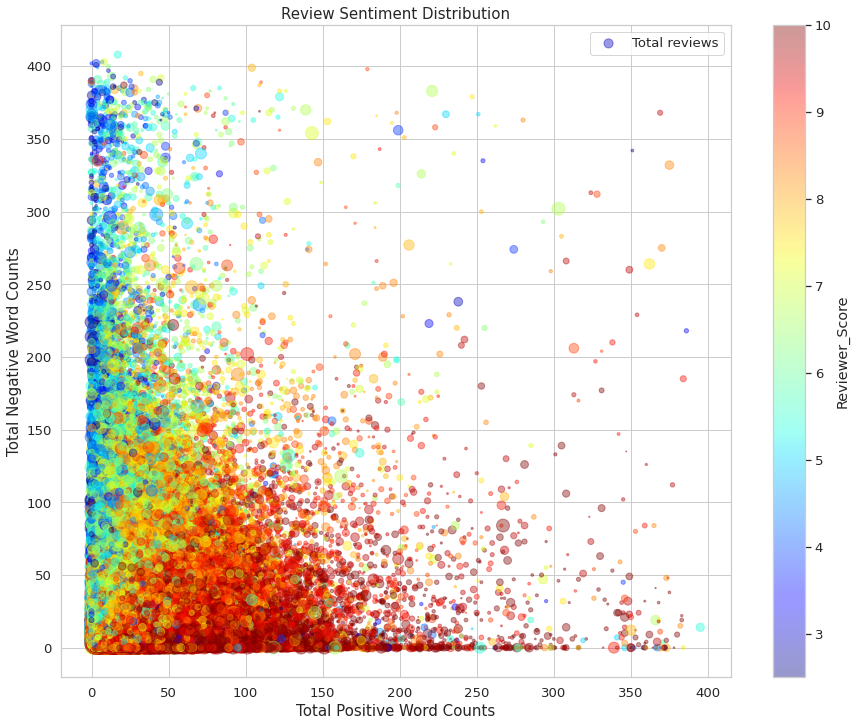

In [22]:
df_hotel_reviews.plot(kind='scatter', 
                      x='Review_Total_Positive_Word_Counts', 
                      y='Review_Total_Negative_Word_Counts', 
                      label='Total reviews',
             s=df_hotel_reviews.Total_Number_of_Reviews/100,
             c='Reviewer_Score',
             cmap=plt.get_cmap('jet'), 
             colorbar=True, 
             alpha=0.4, figsize=(15,12),
             sharex=False, # label not showing up 
             # https://stackoverflow.com/a/69661993/11105356 
             )
font_size = 15
plt.title("Review Sentiment Distribution",  fontsize=font_size)
plt.xlabel("Total Positive Word Counts", fontsize=font_size)
plt.ylabel("Total Negative Word Counts",  fontsize=font_size)
plt.legend()
plt.show()

From the above graph, we can infer that - 

* The value of **Total positive word counts** is lower than **total negative word counts**
* Although the distribution of **Positive Review** seems to dominate negative reviews, the distribution of **Negative Review** has higher negative word count in general

## Reviewer Nationality

### Top 20

In [23]:
# Top 20
df_hotel_reviews.Reviewer_Nationality.value_counts()[:20]

 United Kingdom               245246
 United States of America      35437
 Australia                     21686
 Ireland                       14827
 United Arab Emirates          10235
 Saudi Arabia                   8951
 Netherlands                    8772
 Switzerland                    8678
 Germany                        7941
 Canada                         7894
 France                         7296
 Israel                         6610
 Italy                          6114
 Belgium                        6031
 Turkey                         5444
 Kuwait                         4920
 Spain                          4737
 Romania                        4552
 Russia                         3900
 South Africa                   3821
Name: Reviewer_Nationality, dtype: int64

In [24]:
fig = px.histogram(df_hotel_reviews, x="Average_Score", title='Review Average Score Distribution')
fig.show()

## Positive Vs Negative Word Count Among Hotel Reviews

In [25]:
px.histogram(x=abs(df_hotel_reviews.Review_Total_Positive_Word_Counts - df_hotel_reviews.Review_Total_Negative_Word_Counts), title='Difference Between Total Positive and Negative Word Count Among Hotel Reviews')

# Data Preprocessing

## Cleaning Review Text

> There are some values like `No Positive` in positive review and `No Negative` in negative review which can be counted ass opposite sentiment, hence replacing those phrases

In [26]:
# outliers
df_hotel_reviews['Negative_Review'][1]

'No Negative'

In [27]:
df_hotel_reviews.loc[:, 'Positive_Review'] = df_hotel_reviews.Positive_Review.apply(lambda x: x.replace('No Positive', ''))
df_hotel_reviews.loc[:, 'Negative_Review'] = df_hotel_reviews.Negative_Review.apply(lambda x: x.replace('No Negative', ''))

In [28]:
df_hotel_reviews['Negative_Review'][1]

''

## Merge Feature (Both Review Text)
> I will merge texts from both positive and negative review columns to merge into a single text feature

In [29]:
df_hotel_reviews['review'] = df_hotel_reviews.Positive_Review + df_hotel_reviews.Negative_Review

## Set Sentiment Type
> Setting the sentiment threshold to **7**, everything is negative below **7**

In [30]:
df_hotel_reviews["review_type"] = df_hotel_reviews["Reviewer_Score"].apply(
    lambda x: "bad" if x < 7 else "good")

In [31]:
df_reviews = df_hotel_reviews[["review", "review_type"]]

## Final Preprocessed Dataset

In [32]:
df_reviews

,review,review_type
0,Only the park outside of the hotel was beauti...,bad
1,No real complaints the hotel was great great ...,good
2,Location was good and staff were ok It is cut...,good
3,Great location in nice surroundings the bar a...,bad
4,Amazing location and building Romantic settin...,bad
...,...,...
515733,location no trolly or staff to help you take ...,good
515734,Breakfast was ok and we got earlier check in ...,bad
515735,The ac was useless It was a hot week in vienn...,bad
515736,The rooms are enormous and really comfortable...,good


## Review Type Distribution

In [33]:
# df_reviews.review_type.hist();

fig = px.histogram(df_reviews, x="review_type", title='Review Type Distribution', text_auto=True)
fig.show()

# imbalanced distribution

#### Texts labeled as **`Good`**

In [34]:

df_reviews[df_reviews.review_type == 'good'].review.value_counts()

 Location                                                                                                                                                                                                                                                                                                                                                                                                                                                                                           947
 Everything Nothing                                                                                                                                                                                                                                                                                                                                                                                                                                                                                 938
 Everything             

#### Texts labeled as **`Bad`**

In [35]:
df_reviews[df_reviews.review_type == 'bad'].review.value_counts()

 Nothing Everything                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                  124
 Location                                                                                                                                                                                                                                                                                                                                                                                                                                                                                      

#### Texts labeled as **`Good`**

In [36]:
good_reviews = df_reviews[df_reviews.review_type == "good"]
bad_reviews = df_reviews[df_reviews.review_type == "bad"]

## Word Cloud

In [37]:
good_reviews_text = " ".join(good_reviews.review.to_numpy().tolist())
bad_reviews_text = " ".join(bad_reviews.review.to_numpy().tolist())

In [38]:
# generate Word Cloud
def gen_wc(txt):
    stopwords = set(STOPWORDS) 

    # crisp wordcloud : https://stackoverflow.com/a/28795577/11105356
    wc = WordCloud(width=800, height=400,background_color="white", max_font_size=300, stopwords = stopwords).generate(txt)
    plt.figure(figsize=(14,10))
    plt.imshow(wc, interpolation="bilinear")
    plt.axis('off')
    plt.show()

### `Good` Reviews

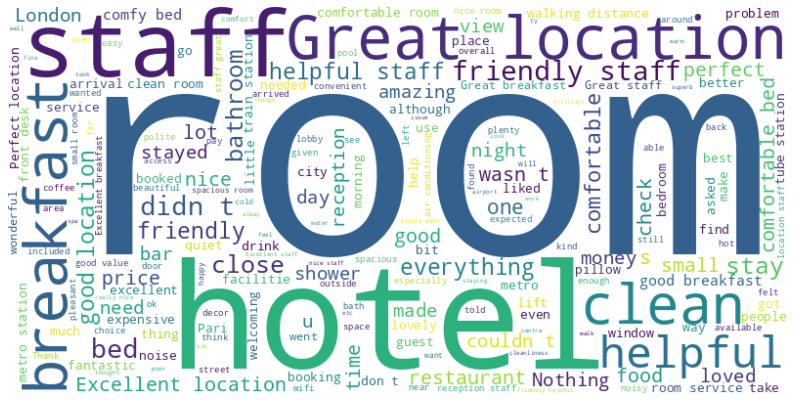

In [39]:
gen_wc(good_reviews_text)

### `Bad` Reviews

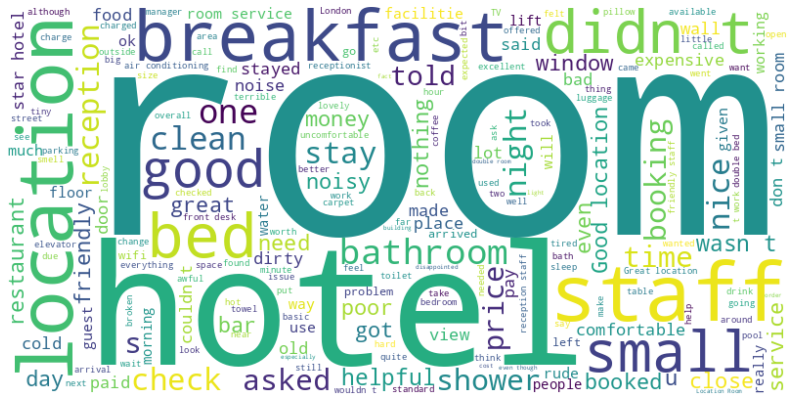

In [40]:
gen_wc(bad_reviews_text)

## Resample Dataset

Under sample the positive review to achieve a balanced distribution between reviews

In [41]:
good_df = good_reviews.sample(n=len(bad_reviews), random_state=RANDOM_SEED)

df_review_resampled = good_df.append(bad_reviews).reset_index(drop=True)
df_review_resampled.shape

(173702, 2)

In [42]:
df_review_resampled.head()

,review,review_type
0,Location was excellent rooms were extremely c...,good
1,very comfortable bed excellent air con great ...,good
2,The views,good
3,Clean and comfortable room Kettle and selecti...,good
4,Beds comfy staff lovely food amazing room spa...,good


#### After Resampled

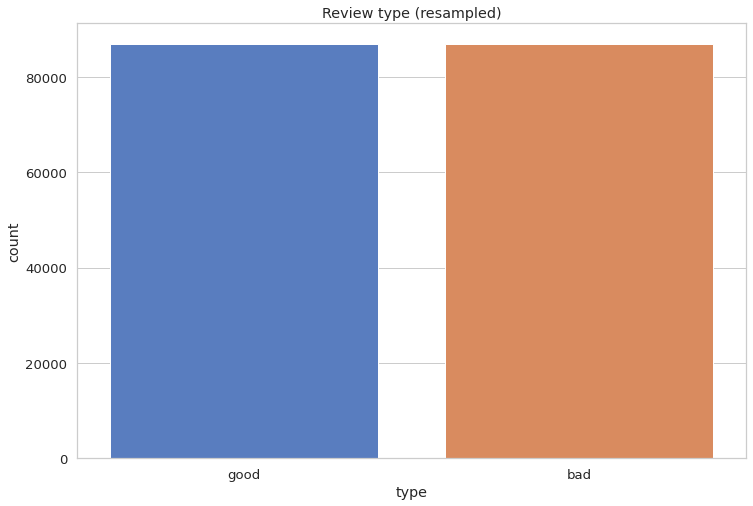

In [43]:
sns.countplot(
  x='review_type',
  data=df_review_resampled,
  order=df_review_resampled.review_type.value_counts().index
)

plt.xlabel("type")
plt.title("Review type (resampled)");

## Data Preparation

### Encoding Labels

In [44]:
# one_hot_encoder = preprocessing.OneHotEncoder(sparse=False)
# encoded_review = one_hot_encoder.fit_transform(df_review_resampled.review_type.to_numpy().reshape(-1, 1))


label_enc = preprocessing.LabelEncoder()
encoded_review = label_enc.fit_transform(df_review_resampled.review_type.values)

### Train/test Split

In [45]:
train_reviews, test_reviews, y_train, y_test = train_test_split(
    df_review_resampled.review, 
    encoded_review, 
    test_size=0.25, 
    random_state=RANDOM_SEED
  )

# Modeling

## Feature Engineering

### TF-IDF

In [46]:
%%time
tfv = TfidfVectorizer(min_df=3,  max_features=None, 
            strip_accents='unicode', analyzer='word',token_pattern=r'\w{1,}',
            ngram_range=(1, 3), use_idf=1,smooth_idf=1,sublinear_tf=1,
            stop_words = 'english')

tfv.fit(list(train_reviews) + list(test_reviews))

X_train_tfv =  tfv.transform(train_reviews) 
X_test_tfv = tfv.transform(test_reviews)

CPU times: user 30.2 s, sys: 756 ms, total: 31 s
Wall time: 31.1 s


#### LSA Plot

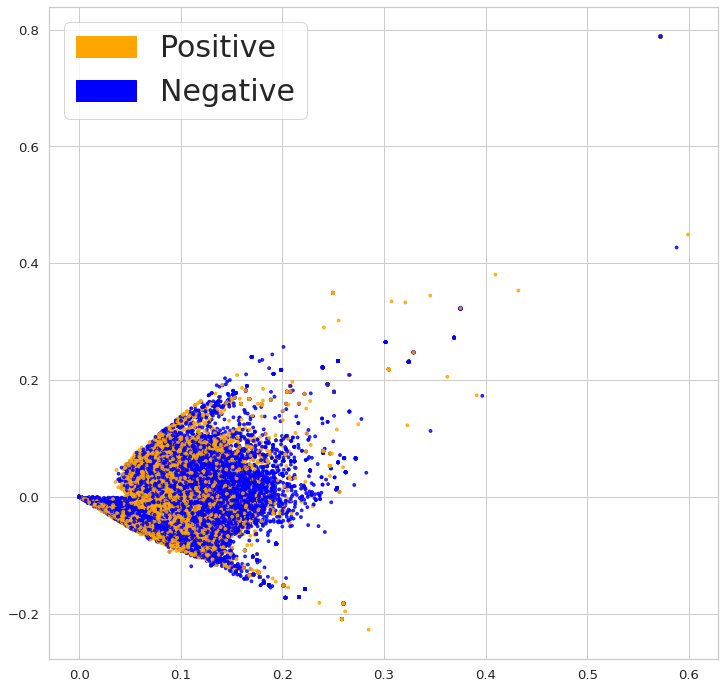

In [47]:
# FYI LSA -> Latent semantic analysis 

def plot_LSA(test_data, test_labels):
    lsa = TruncatedSVD(n_components=2)
    lsa.fit(test_data)
    lsa_scores = lsa.transform(test_data)

    colors = ['orange','blue']
    plt.scatter(lsa_scores[:,0], lsa_scores[:,1], s=8, alpha=.8, c=test_labels, cmap=matplotlib.colors.ListedColormap(colors))
    orange_patch = mpatches.Patch(color='orange', label='Positive')
    blue_pah = mpatches.Patch(color='blue', label='Negative')
    plt.legend(handles=[orange_patch, blue_patch], prop={'size': 30})

fig = plt.figure(figsize=(12, 12))          
plot_LSA(X_train_tfv, y_train)
plt.show()

### Count Features

In [48]:
%%time
ctv = CountVectorizer(analyzer='word',token_pattern=r'\w{1,}',
            ngram_range=(1, 3), stop_words = 'english')

# Fitting Count Vectorizer to both training and test sets (semi-supervised learning)
ctv.fit(list(train_reviews) + list(test_reviews))

X_train_ctv=  ctv.transform(train_reviews) 
X_test_ctv = ctv.transform(test_reviews)

CPU times: user 39.9 s, sys: 897 ms, total: 40.8 s
Wall time: 40.9 s


#### LSA Plot

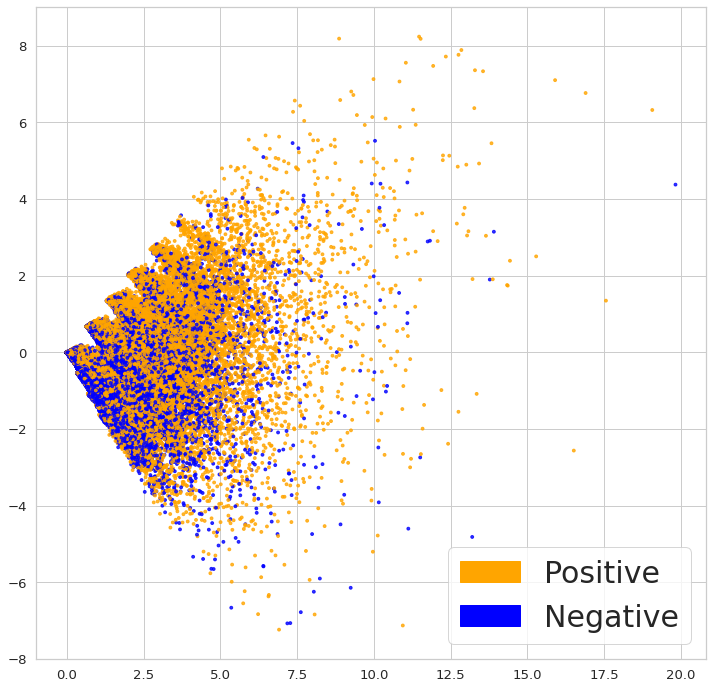

In [49]:
fig = plt.figure(figsize=(12, 12))          
plot_LSA(X_train_ctv, y_train)
plt.show()

# Logistic Regression

**Utility Function**

In [50]:
def model_predict(clf, X_train,y_train, X_test, y_test):
    clf.fit(X_train, y_train)
    predictions = clf.predict_proba(X_test)
    
    print (f"logloss: {metrics.log_loss(y_test, predictions):0.3f}")
    print (f"ROC AUC: {metrics.roc_auc_score(y_test, predictions[:, 1]):0.3f}")

In [51]:
%%time
# issue: https://stackoverflow.com/a/66560912/11105356
clf = LogisticRegression(C=1.0, solver='lbfgs', max_iter=1000)

# count vector feature
model_predict(clf, X_train_ctv,y_train, X_test_ctv, y_test)

logloss: 0.456
ROC AUC: 0.894
CPU times: user 5min 18s, sys: 1min 42s, total: 7min
Wall time: 4min 17s


In [52]:
%%time

# Tf-IDF feature 
model_predict(clf, X_train_tfv,y_train, X_test_tfv, y_test)

logloss: 0.403
ROC AUC: 0.900
CPU times: user 30.2 s, sys: 19.3 s, total: 49.6 s
Wall time: 26.4 s


# Naive Bayes

In [53]:
%%time
clf = MultinomialNB()

# Tf-IDF feature 
model_predict(clf, X_train_tfv, y_train, X_test_tfv, y_test)

logloss: 0.414
ROC AUC: 0.892
CPU times: user 125 ms, sys: 22.8 ms, total: 148 ms
Wall time: 108 ms


In [54]:
%%time

# count vector feature 
model_predict(clf, X_train_ctv, y_train, X_test_ctv, y_test)

logloss: 1.245
ROC AUC: 0.877
CPU times: user 330 ms, sys: 123 ms, total: 452 ms
Wall time: 452 ms


# SVM

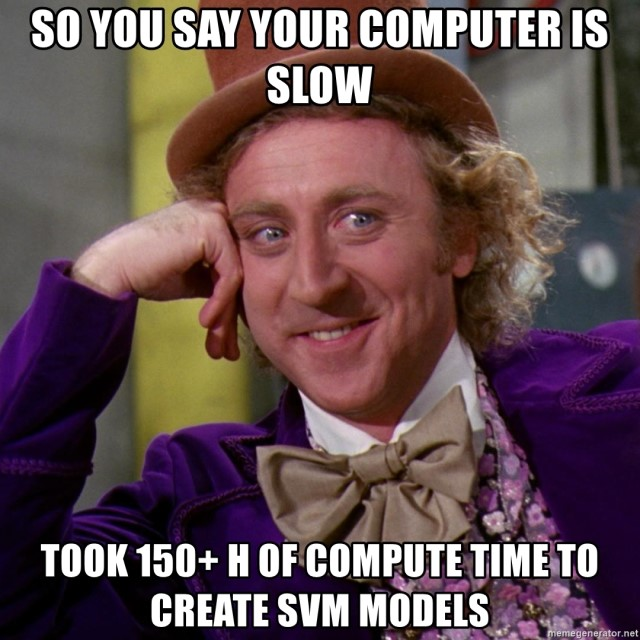


**!!! Warning !!! Run at your own  risk**

In [55]:
# svd = decomposition.TruncatedSVD(n_components=120) # 120-200 is a good range
# svd.fit(X_train_tfv)
# X_train_svd = svd.transform(X_train_tfv)
# X_test_svd = svd.transform(X_test_tfv)
# # 
# scl = preprocessing.StandardScaler()
# scl.fit(X_train_svd)
# X_train_svd_scl = scl.transform(X_train_svd)
# X_test_svd_scl = scl.transform(X_test_svd)

In [56]:
%%time

# it never ends :v

# clf = SVC(C=1.0, probability=True) # since we need probabilities

# model_predict(clf, X_train_svd_scl, y_train, X_test_svd_scl, y_test)

CPU times: user 5 µs, sys: 1 µs, total: 6 µs
Wall time: 10.3 µs


# XGBoost

In [57]:
%%time
clf = xgb.XGBClassifier(max_depth=7, n_estimators=200, colsample_bytree=0.8, 
#                         tree_method='gpu_hist', gpu_id=0, 
                        use_label_encoder=False,
                        subsample=0.8, nthread=10, learning_rate=0.01)
model_predict(clf, X_train_tfv, y_train, X_test_tfv, y_test)

[20:22:42] WARNING: ../src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
logloss: 0.560
ROC AUC: 0.818
CPU times: user 8min 33s, sys: 1.68 s, total: 8min 35s
Wall time: 4min 35s


In [58]:
%%time
model_predict(clf, X_train_ctv, y_train, X_test_ctv, y_test)

[20:27:18] WARNING: ../src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
logloss: 0.561
ROC AUC: 0.817
CPU times: user 14min 38s, sys: 3.22 s, total: 14min 41s
Wall time: 8min 18s


## Grid Search

In [59]:
model_scorer = metrics.make_scorer(metrics.log_loss, greater_is_better=False, needs_proba=True)

# model_scorer = metrics.make_scorer(metrics.roc_auc_score, greater_is_better=True, needs_proba=True)


svd = TruncatedSVD()
  
scl = preprocessing.StandardScaler()

# `ValueError: Solver lbfgs supports only 'l2' or 'none' penalties, got l1 penalty` fix
# https://stackoverflow.com/a/60868685/11105356

lr_model = LogisticRegression(solver='liblinear')
# Solver lbfgs supports only 'l2' or 'none' penalties
clf = pipeline.Pipeline([('svd', svd),
                         ('scl', scl),
                         ('lr', lr_model)])


param_grid = {'svd__n_components' : [120, 200],
              'lr__C': [0.1, 1.0, 10], 
              'lr__penalty': ['l1', 'l2']}


model = GridSearchCV(estimator=clf, param_grid=param_grid, scoring=model_scorer,
                                 verbose=10, n_jobs=-1, refit=True, cv=2)

In [60]:
%%time

model.fit(X_train_tfv, y_train)  # we can use the full data here but im only using xtrain
print(f"Best score: {model.best_score_:0.3f}")

print("Best parameters set:")
best_parameters = model.best_estimator_.get_params()

for param_name in sorted(param_grid.keys()):
    print("\t%s: %r" % (param_name, best_parameters[param_name]))

Fitting 2 folds for each of 12 candidates, totalling 24 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:   40.7s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:  4.0min
[Parallel(n_jobs=-1)]: Done  14 tasks      | elapsed:  5.7min
[Parallel(n_jobs=-1)]: Done  21 tasks      | elapsed:  9.0min
[Parallel(n_jobs=-1)]: Done  24 out of  24 | elapsed: 10.1min remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  24 out of  24 | elapsed: 10.1min finished


Best score: -0.437
Best parameters set:
	lr__C: 1.0
	lr__penalty: 'l2'
	svd__n_components: 200
CPU times: user 1min 2s, sys: 11.3 s, total: 1min 13s
Wall time: 10min 58s


## Word Vectors
### Universal Sentence Encoder from TF-HUB

---
GPU was capped at **10%-20%**, took approximately 50 minutes for each run (train and test embedding)

In [62]:
X_train = []
for r in tqdm(train_reviews):
    emb = use(r)
    review_emb = tf.reshape(emb, [-1]).numpy()
    X_train.append(review_emb)

X_train = np.array(X_train)

100%|██████████| 130276/130276 [42:46<00:00, 50.76it/s] 


In [63]:
X_test = []
for r in tqdm(test_reviews):
    emb = use(r)
    review_emb = tf.reshape(emb, [-1]).numpy()
    X_test.append(review_emb)

X_test = np.array(X_test)

100%|██████████| 43426/43426 [14:19<00:00, 50.52it/s]


In [64]:
print(X_train.shape, X_test.shape)

(130276, 512) (43426, 512)


In [65]:
print(y_train.shape, y_test.shape)

(130276,) (43426,)


## Deep Learning Modeling

## Utility Function

In [66]:
# plot accuracy and loss
def plot_history(history):
    accuracy = history.history['accuracy']
    val_accuracy= history.history['val_accuracy']
    loss = history.history['loss']
    val_loss = history.history['val_loss']

    epochs = range(1, len(accuracy) + 1)
    plt.plot(epochs, accuracy, 'bo', label='Training accuracy')
    plt.plot(epochs, val_accuracy, 'b', label='Validation accuracy')

    plt.title('Training and validation accuracy')
    plt.legend()
    plt.figure()

    plt.plot(epochs, loss, 'bo', label='Training loss')
    plt.plot(epochs, val_loss, 'b', label='Validation loss')
    plt.title('Training and validation loss')
    plt.legend()
    plt.show()

    
# plot model architecture
def plot_model(model):
    model.summary()
    return tf.keras.utils.plot_model(
    model,
    to_file="model.png",
    show_shapes=True,
    show_dtype=False,
    show_layer_names=True,
    rankdir="TB",
    expand_nested=True,
    dpi=96,
    layer_range=None,
    )

# Baseline NN Model

In [67]:
def build_model_1():
    model = Sequential()
    model.add(Dense(256, activation='relu', input_shape=(X_train.shape[1],)))
    model.add(Dropout(0.25))
    model.add(Dense(128, activation='relu'))
    model.add(Dropout(0.25))
    model.add(Dense(1, activation='sigmoid'))

    model.compile(loss='binary_crossentropy',
            metrics=['accuracy'],
            optimizer=Adam(learning_rate=0.001))
    return model

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 256)               131328    
_________________________________________________________________
dropout (Dropout)            (None, 256)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 128)               32896     
_________________________________________________________________
dropout_1 (Dropout)          (None, 128)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 1)                 129       
Total params: 164,353
Trainable params: 164,353
Non-trainable params: 0
_________________________________________________________________


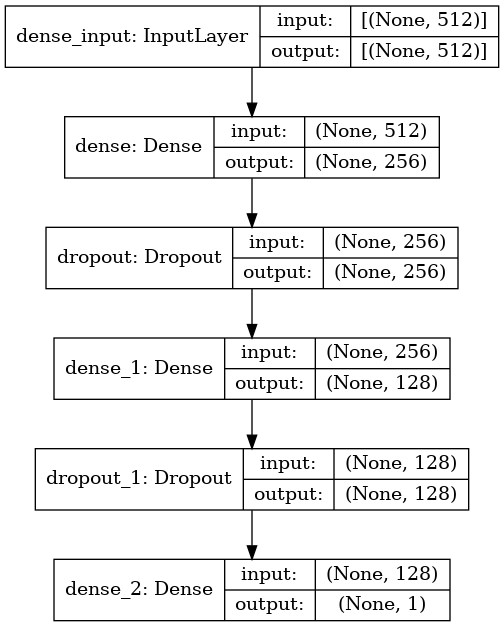

In [68]:
model_1 = build_model_1()
plot_model(model_1)

In [69]:
history = model_1.fit(
    X_train, y_train, 
    epochs=10, 
    batch_size=16, 
    validation_split=0.1, # since the data dimension is big
    verbose=1, 
    shuffle=True
)

Epoch 1/10
7328/7328 [==============================] - 17s 2ms/step - loss: 0.4280 - accuracy: 0.7984 - val_loss: 0.4188 - val_accuracy: 0.8045
Epoch 2/10
7328/7328 [==============================] - 15s 2ms/step - loss: 0.4062 - accuracy: 0.8109 - val_loss: 0.4221 - val_accuracy: 0.8028
Epoch 3/10
7328/7328 [==============================] - 16s 2ms/step - loss: 0.3937 - accuracy: 0.8189 - val_loss: 0.4005 - val_accuracy: 0.8136
Epoch 4/10
7328/7328 [==============================] - 15s 2ms/step - loss: 0.3818 - accuracy: 0.8255 - val_loss: 0.3957 - val_accuracy: 0.8165
Epoch 5/10
7328/7328 [==============================] - 16s 2ms/step - loss: 0.3699 - accuracy: 0.8319 - val_loss: 0.4003 - val_accuracy: 0.8113
Epoch 6/10
7328/7328 [==============================] - 16s 2ms/step - loss: 0.3596 - accuracy: 0.8379 - val_loss: 0.3990 - val_accuracy: 0.8142
Epoch 7/10
7328/7328 [==============================] - 16s 2ms/step - loss: 0.3476 - accuracy: 0.8437 - val_loss: 0.4008 - val_ac

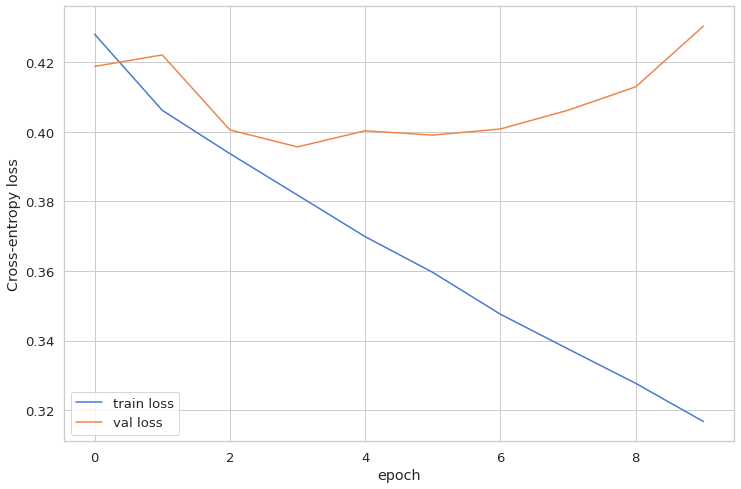

In [70]:
plt.plot(history.history['loss'], label='train loss')
plt.plot(history.history['val_loss'], label='val loss')
plt.xlabel("epoch")
plt.ylabel("Cross-entropy loss")
plt.legend();

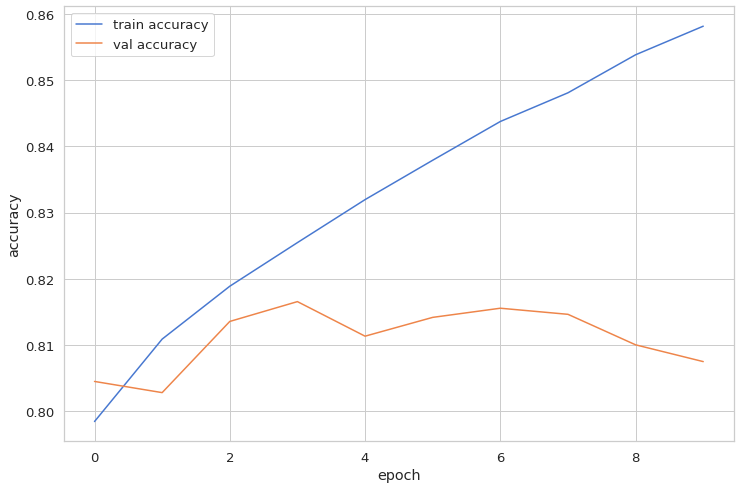

In [71]:
plt.plot(history.history['accuracy'], label='train accuracy')
plt.plot(history.history['val_accuracy'], label='val accuracy')
plt.xlabel("epoch")
plt.ylabel("accuracy")
plt.legend();

In [72]:
# mode levaluation
model_1.evaluate(X_test, y_test)

1358/1358 [==============================] - 2s 2ms/step - loss: 0.4395 - accuracy: 0.8058


[0.43946170806884766, 0.8058305978775024]

## Prediction

In [73]:
# predict_classes() was removed in tf 2.6+, predict_proba(): use predict()
# https://keras.rstudio.com/reference/predict_proba.html#details

# check keras source code
# https://github.com/keras-team/keras/blob/f0eb8d538c82798944346b4b2df917a06bf5e9d4/keras/engine/sequential.py#L254

y_pred_probas = model_1.predict(X_test) 
y_pred_classes = (y_pred_probas > 0.5).astype('int32')

### Test Samples

In [74]:
print(test_reviews.iloc[0])
print("Bad" if y_pred_classes[0] == 0 else "Good", y_pred_probas[0])

 Location staff  Asked for late checkout and didnt get an answer then got a yes but had to pay 25 euros by noon they called to say sorry you have to leave in 1h knowing that i had a sick dog and an appointment next to the hotel 
Bad [0.03223355]


In [75]:
print(test_reviews.iloc[5])
print("Bad" if y_test[5] == 0 else "Good")

 Easy to find Easy location No traffic noise in room  Flooded bathroom from room above Painting and decorating blocking stair access 
Bad


In [76]:
print(y_pred_probas[5])
"Bad" if  y_pred_classes[5] == 0 else "Good"

[0.24989007]


'Bad'

# LSTM Model

In [77]:
y_train.shape

(130276,)

## Reshape Dataset

**For an LSTM layer, you need the shape like  `(NumberOfExamples, TimeSteps, FeaturesPerStep)`**

In [78]:
X_train_reshaped = X_train[:, newaxis,:]
X_test_reshaped = X_test[:, newaxis,:]

In [79]:
X_train_reshaped.shape

(130276, 1, 512)

In [80]:
# input_shape
1,X_train_reshaped.shape[2]

(1, 512)

## LSTM_1

In [81]:
def build_model_lstm():
    model = Sequential()
    model.add(LSTM(256, activation='sigmoid', return_sequences=True,
                 input_shape=(1,X_train_reshaped.shape[2])
                 ))
    model.add(Dense(128, activation='relu'))
    model.add(Dense(1, activation='sigmoid'))
    model.compile(loss='binary_crossentropy',
            metrics=['accuracy'],
            optimizer=Adam(learning_rate=0.0005))
    return model

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm (LSTM)                  (None, 1, 256)            787456    
_________________________________________________________________
dense_3 (Dense)              (None, 1, 128)            32896     
_________________________________________________________________
dense_4 (Dense)              (None, 1, 1)              129       
Total params: 820,481
Trainable params: 820,481
Non-trainable params: 0
_________________________________________________________________


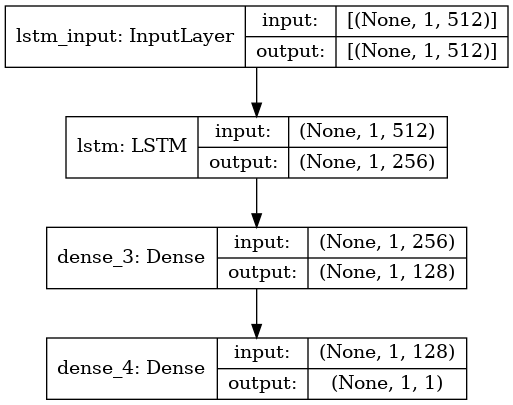

In [82]:
model_lstm_1 = build_model_lstm()
plot_model(model_lstm_1)

In [83]:
%%time

history_lstm_1 = model_lstm_1.fit(
    X_train_reshaped, y_train, 
    epochs=10, 
    batch_size=16, 
    validation_split=0.1, 
    verbose=1, 
    shuffle=True # text data, safe to shuffle
)

Epoch 1/10
7328/7328 [==============================] - 24s 3ms/step - loss: 0.4505 - accuracy: 0.7845 - val_loss: 0.4300 - val_accuracy: 0.7961
Epoch 2/10
7328/7328 [==============================] - 23s 3ms/step - loss: 0.4239 - accuracy: 0.7989 - val_loss: 0.4222 - val_accuracy: 0.7992
Epoch 3/10
7328/7328 [==============================] - 24s 3ms/step - loss: 0.4185 - accuracy: 0.8014 - val_loss: 0.4175 - val_accuracy: 0.8017
Epoch 4/10
7328/7328 [==============================] - 23s 3ms/step - loss: 0.4149 - accuracy: 0.8033 - val_loss: 0.4162 - val_accuracy: 0.8023
Epoch 5/10
7328/7328 [==============================] - 23s 3ms/step - loss: 0.4127 - accuracy: 0.8052 - val_loss: 0.4133 - val_accuracy: 0.8052
Epoch 6/10
7328/7328 [==============================] - 24s 3ms/step - loss: 0.4114 - accuracy: 0.8049 - val_loss: 0.4152 - val_accuracy: 0.8050
Epoch 7/10
7328/7328 [==============================] - 23s 3ms/step - loss: 0.4094 - accuracy: 0.8068 - val_loss: 0.4200 - val_ac

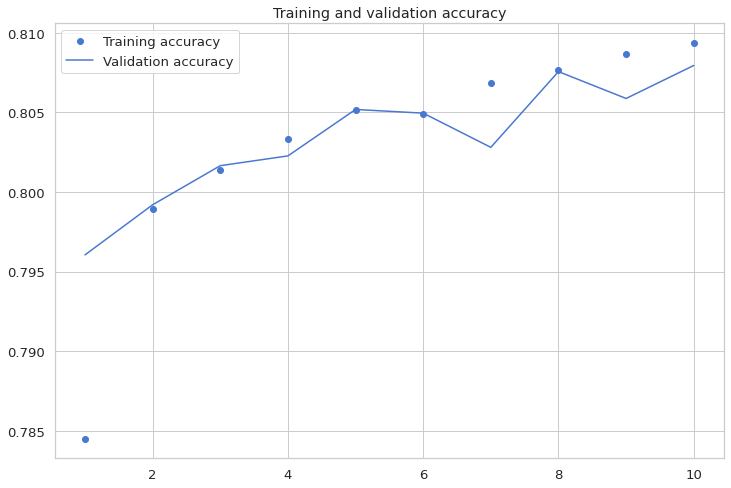

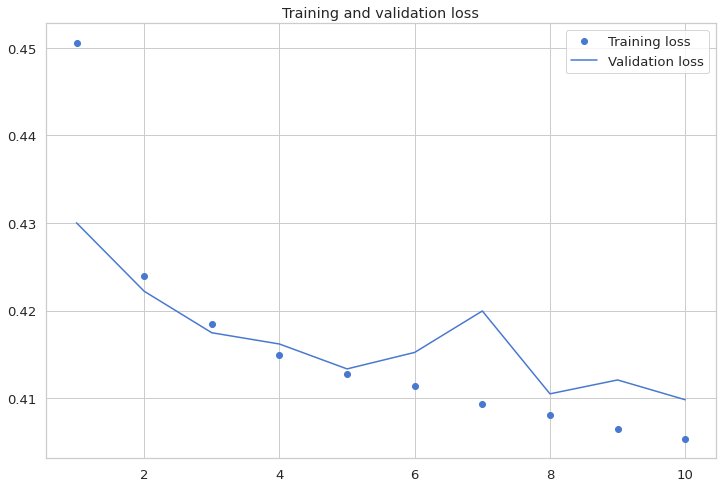

In [84]:
plot_history(history_lstm_1)

In [85]:
model_lstm_1.evaluate(X_test_reshaped, y_test)

1358/1358 [==============================] - 4s 3ms/step - loss: 0.4147 - accuracy: 0.8032


[0.41472840309143066, 0.8031594157218933]

## LSTM_2

In [86]:
# https://www.tensorflow.org/api_docs/python/tf/keras/layers/LSTM

def build_model_lstm_2():
    model = Sequential()
    model.add(LSTM(256, activation='relu', return_sequences=True,
                 input_shape=(1,X_train_reshaped.shape[2])
                 ))
    model.add(LSTM(128, dropout=0.2, activation='relu', return_sequences=True))
    model.add(LSTM(64, dropout=0.2, activation='relu',  return_sequences=True))
    model.add(Dense(1, activation='sigmoid'))
    model.compile(loss='binary_crossentropy',
            metrics=['accuracy'],
            optimizer=Adam(learning_rate=0.0005))
    return model

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 1, 256)            787456    
_________________________________________________________________
lstm_2 (LSTM)                (None, 1, 128)            197120    
_________________________________________________________________
lstm_3 (LSTM)                (None, 1, 64)             49408     
_________________________________________________________________
dense_5 (Dense)              (None, 1, 1)              65        
Total params: 1,034,049
Trainable params: 1,034,049
Non-trainable params: 0
_________________________________________________________________


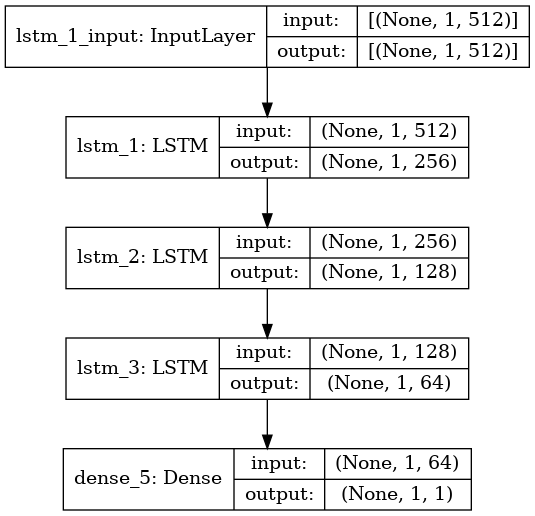

In [87]:
model_lstm_2 = build_model_lstm_2()
plot_model(model_lstm_2)

In [88]:
%%time
history = model_lstm_2.fit(
    X_train_reshaped, y_train, 
    epochs=10, 
    batch_size=16, 
    validation_split=0.1, 
    verbose=1, 
    shuffle=True
)

Epoch 1/10
7328/7328 [==============================] - 47s 6ms/step - loss: 0.4329 - accuracy: 0.7938 - val_loss: 0.4156 - val_accuracy: 0.8040
Epoch 2/10
7328/7328 [==============================] - 44s 6ms/step - loss: 0.4071 - accuracy: 0.8102 - val_loss: 0.4055 - val_accuracy: 0.8090
Epoch 3/10
7328/7328 [==============================] - 45s 6ms/step - loss: 0.3943 - accuracy: 0.8177 - val_loss: 0.3987 - val_accuracy: 0.8147
Epoch 4/10
7328/7328 [==============================] - 44s 6ms/step - loss: 0.3839 - accuracy: 0.8235 - val_loss: 0.3985 - val_accuracy: 0.8153
Epoch 5/10
7328/7328 [==============================] - 44s 6ms/step - loss: 0.3739 - accuracy: 0.8300 - val_loss: 0.3974 - val_accuracy: 0.8147
Epoch 6/10
7328/7328 [==============================] - 45s 6ms/step - loss: 0.3633 - accuracy: 0.8366 - val_loss: 0.4026 - val_accuracy: 0.8165
Epoch 7/10
7328/7328 [==============================] - 45s 6ms/step - loss: 0.3509 - accuracy: 0.8433 - val_loss: 0.3980 - val_ac

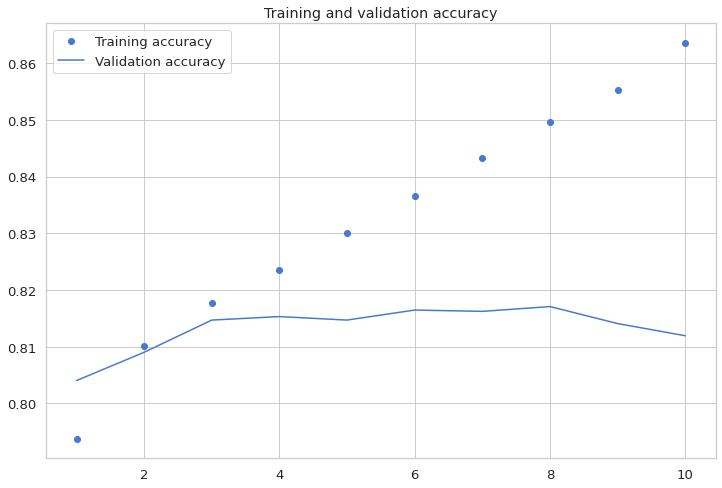

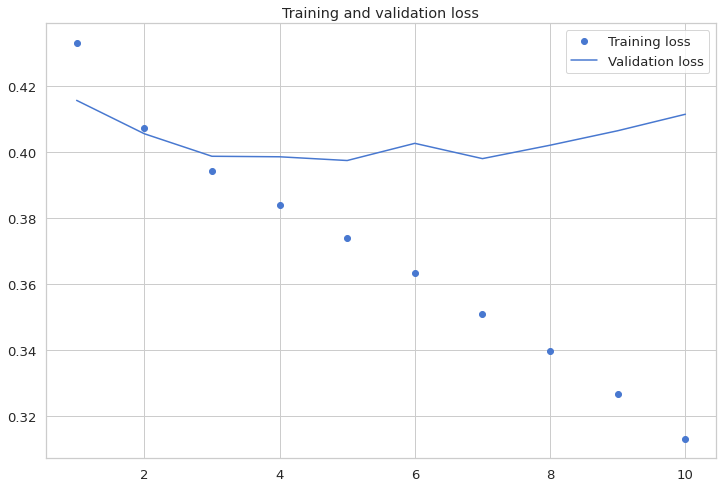

In [89]:
plot_history(history)

In [90]:
model_lstm_2.evaluate(X_test_reshaped, y_test)

1358/1358 [==============================] - 4s 3ms/step - loss: 0.4236 - accuracy: 0.8094


[0.42359650135040283, 0.8094459772109985]

# Bi-LSTM

There is no final, definite, rule of thumb on how many nodes (or hidden neurons) or how many layers one should choose, and very often a trial and error approach will give you the best results for your individual problem. The most common framework for this is most likely the k-fold cross-validation. However, even for a testing procedure, we need to choose some (k) numbers of nodes.

The following formula may give you a starting point, [Check out the post here](https://stats.stackexchange.com/questions/181/how-to-choose-the-number-of-hidden-layers-and-nodes-in-a-feedforward-neural-netw/136542#136542)

---
<img src="https://user-images.githubusercontent.com/40615350/156080888-6b0a7f65-be66-46b8-83b4-bdf0422fdf4d.png">

In [91]:
X_train.shape[0]

130276

In [92]:
# alpha value 2 works pretty well for most cases

X_train.shape[0] / (2* (X_train.shape[1]+1))

# according to the result (~127 ≈ 128) I will use 128 units per hidden layers

126.97465886939571

In [93]:
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2,
                              patience=5, min_lr=0.001)

In [94]:
def build_model_lstm_3():
    model = Sequential()
    model.add(Bidirectional(LSTM(64, activation='relu', return_sequences=True),
                 input_shape=(1,X_train_reshaped.shape[2])
                 ))
    model.add(Bidirectional(LSTM(64, activation='relu', return_sequences=True)))
#     model.add(Dense(128, activation='relu'))
    model.add(Dense(1, activation='sigmoid'))
    model.compile(loss='binary_crossentropy',
            metrics=['accuracy'],
            optimizer=Adam(learning_rate=0.0005))
    return model

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
bidirectional (Bidirectional (None, 1, 128)            295424    
_________________________________________________________________
bidirectional_1 (Bidirection (None, 1, 128)            98816     
_________________________________________________________________
dense_6 (Dense)              (None, 1, 1)              129       
Total params: 394,369
Trainable params: 394,369
Non-trainable params: 0
_________________________________________________________________


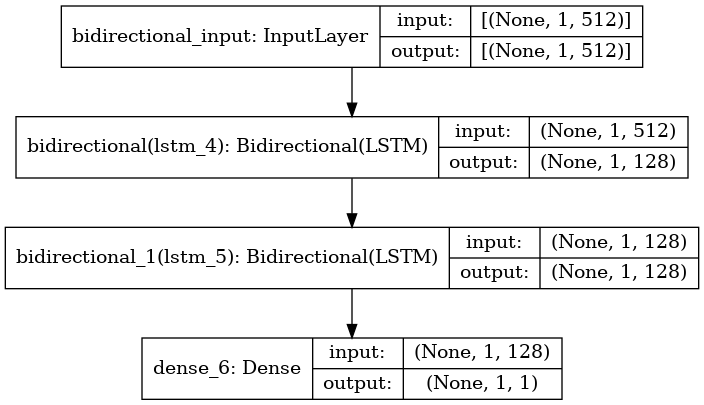

In [95]:
model_lstm_3 = build_model_lstm_3()
plot_model(model_lstm_3)

In [96]:
%%time
history = model_lstm_3.fit(
    X_train_reshaped, y_train, 
    epochs=10, 
    batch_size=64, 
    validation_split=0.1, 
    verbose=1, 
    shuffle=True,
    callbacks=[reduce_lr]
)

Epoch 1/10
1832/1832 [==============================] - 16s 8ms/step - loss: 0.4414 - accuracy: 0.7903 - val_loss: 0.4180 - val_accuracy: 0.8051
Epoch 2/10
1832/1832 [==============================] - 12s 7ms/step - loss: 0.4112 - accuracy: 0.8062 - val_loss: 0.4118 - val_accuracy: 0.8076
Epoch 3/10
1832/1832 [==============================] - 13s 7ms/step - loss: 0.4025 - accuracy: 0.8117 - val_loss: 0.4078 - val_accuracy: 0.8085
Epoch 4/10
1832/1832 [==============================] - 13s 7ms/step - loss: 0.3952 - accuracy: 0.8165 - val_loss: 0.4037 - val_accuracy: 0.8123
Epoch 5/10
1832/1832 [==============================] - 12s 7ms/step - loss: 0.3893 - accuracy: 0.8203 - val_loss: 0.4009 - val_accuracy: 0.8136
Epoch 6/10
1832/1832 [==============================] - 13s 7ms/step - loss: 0.3835 - accuracy: 0.8241 - val_loss: 0.3995 - val_accuracy: 0.8152
Epoch 7/10
1832/1832 [==============================] - 13s 7ms/step - loss: 0.3787 - accuracy: 0.8269 - val_loss: 0.4004 - val_ac

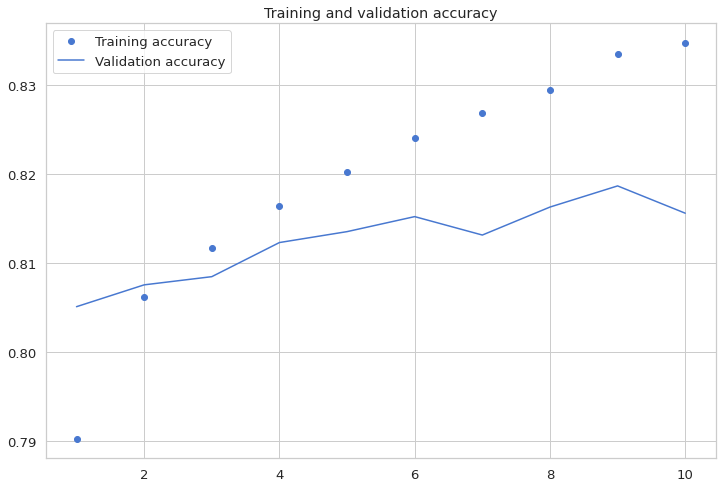

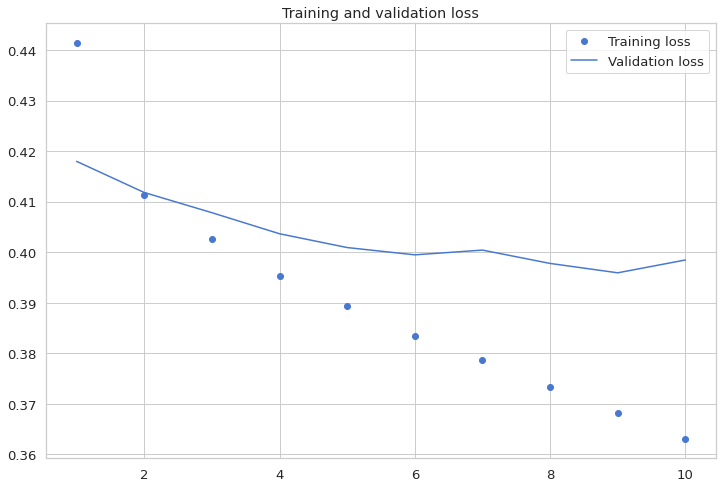

In [97]:
plot_history(history)

The model looks not bad,
It's less overfitting

In [98]:
model_lstm_3.evaluate(X_test_reshaped, y_test)

1358/1358 [==============================] - 5s 3ms/step - loss: 0.4055 - accuracy: 0.8123


[0.4054696261882782, 0.8123244047164917]

# Serve Model

## Save Model

In [99]:
model_lstm_2.save("lstm_sentiment_model.h5")

## Load Model

In [100]:
imported_model = tf.keras.models.load_model('./lstm_sentiment_model.h5')
imported_model.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 1, 256)            787456    
_________________________________________________________________
lstm_2 (LSTM)                (None, 1, 128)            197120    
_________________________________________________________________
lstm_3 (LSTM)                (None, 1, 64)             49408     
_________________________________________________________________
dense_5 (Dense)              (None, 1, 1)              65        
Total params: 1,034,049
Trainable params: 1,034,049
Non-trainable params: 0
_________________________________________________________________


## Prediction

### Positive Sentiment

In [101]:
text = 'This room is great'
emb_test = use(text)
emb_test.shape

TensorShape([1, 512])

In [102]:
emb_test_reshaped = emb_test[:, newaxis, :]
emb_test_reshaped.shape

TensorShape([1, 1, 512])

In [103]:
np.squeeze(imported_model.predict(emb_test_reshaped))[()]

0.9029406

In [104]:
(imported_model.predict(emb_test_reshaped)[0][0][0] > 0.5).astype('int32')

1

In [105]:
sentiment_val = (imported_model.predict(emb_test_reshaped) > 0.5).astype('int32')

"Good" if sentiment_val == 1 else "Bad"

'Good'

### Negative Sentiment

In [106]:
text = 'This room is small'
emb_test = use(text)

emb_test_reshaped = emb_test[:, newaxis, :]
emb_test_reshaped.shape

np.squeeze(imported_model.predict(emb_test_reshaped))[()]

0.20774996

In [107]:
sentimen_val = (imported_model.predict(emb_test_reshaped) > 0.5).astype('int32')

"Good" if sentimen_val == 1 else "Bad"

'Bad'

## Prediction Pipeline

In [108]:
def predict_sentiment(txt):
    emb_txt = use(txt)
    emb_test_reshaped = emb_txt[:, newaxis, :]
    sentiment_val = (imported_model.predict(emb_test_reshaped) > 0.5).astype('int32')
    print("Score:", imported_model.predict(emb_test_reshaped).flatten()[0])
    return "Positive" if sentiment_val == 1 else "Negative"

In [109]:
sample_text = "I love the room service"
print(f"The sentiment of this sentence is : {predict_sentiment(sample_text)}")

Score: 0.84181726
The sentiment of this sentence is : Positive


In [110]:
sample_text = "I like the room service but the bathroom is small"
print(f"The sentiment of this sentence is : {predict_sentiment(sample_text)}")

Score: 0.69958645
The sentiment of this sentence is : Positive


In [111]:
sample_text = "The windows is so big. it has good air circulation"
print(f"The sentiment of this sentence is : {predict_sentiment(sample_text)}")

Score: 0.9608146
The sentiment of this sentence is : Positive


In [112]:
sample_text = "The windows is so small. it has bad air circulation"
print(f"The sentiment of this sentence is : {predict_sentiment(sample_text)}")

Score: 0.14679445
The sentiment of this sentence is : Negative
